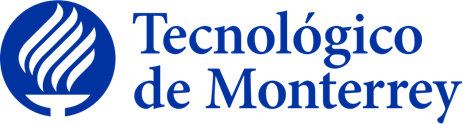

# **Maestría en Inteligencia Artificial Aplicada**
## **Curso: Visión computacional para imágenes y video - TC4033.10**
### Prof: Dr. Gilberto Ochoa Ruiz

## **7.2 Google Colab algoritmos de extracción de características**
## **Image Matching**
### Febrero 24 de 2024

Los ejercicios que deben agregarse a este proyecto serán los siguientes:

 b) En cuanto al Collab de matching, no se espera tampoco que se haga ninguna modificación al código, pero la idea es probar que tan buenos son los diferentes descriptores para hacer matching de imagenes. Se sugiere usar las imágenes con variaciones de iluminación y orientación y ver que tan bien se hace el matching con Harris por si mismo, o con otros descriptores como SIFT u ORB. Discuta sus hallazgos


## **Nombres y matrículas de los integrantes del Equipo 24:**

* Victor Alejandro Regueira Romero | A01794404
* Fernando Maytorena Espinosa de los Monteros | A01110946
* Edgar Rodolfo Escobar Gómez | A01793900
* Jonathan Garza Bennet | A01793038
* Rafael José Mateo Comprés | A01793054

Nota: Nuestro código de la actividad se encuentra al final, después del código de ejemplo suministrado por el profesor.

# 9. Image Matching

## Table of Contents
1. [Libraries](#libraries)
1. [ORB Matching](#orb)
1. [SIFT Matching](#sift)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

#Equipo 24
import urllib.request

# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

In [ ]:
#Función que descarga una imágen por medio de una URL y le asigna y entrega el nombre image.jpg
def download_image(url):
    # Construye un nombre de archivo basado en la URL (podrías querer personalizar esto)
    file_name = "image.jpg"
    # Descarga la imagen
    urllib.request.urlretrieve(url, file_name)
    return file_name

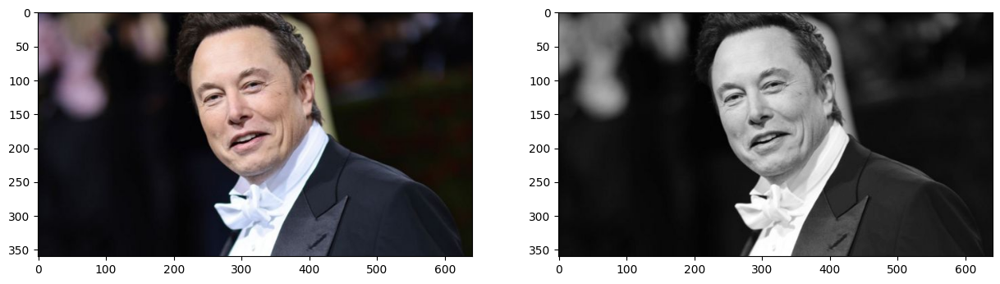

In [ ]:
#reading image
ELON_1 = 'https://raw.githubusercontent.com/Edgar-IAH/TC4033data/main/data72/elon_1.jpg'
image_path = download_image(ELON_1)
img = cv2.imread(image_path)
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")
plt.show()

### Create test image by adding Scale Invariance and Rotational Invariance

In [ ]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

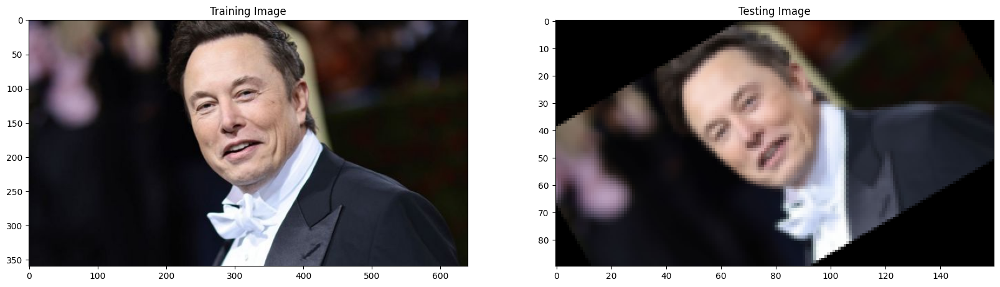

In [ ]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)
plt.show()

### ORB

In [ ]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  42


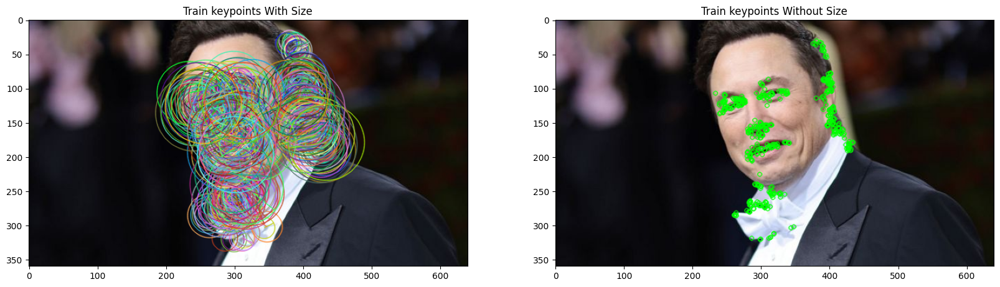

In [ ]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

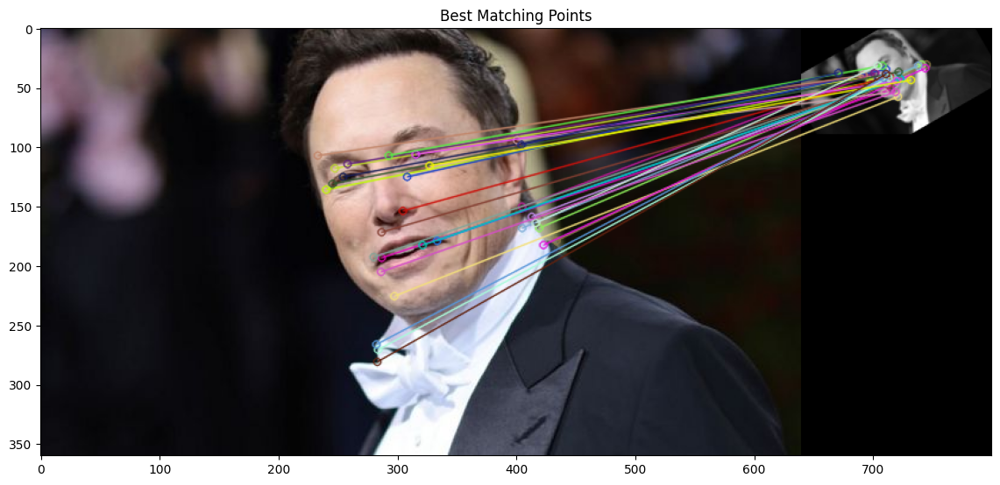


Number of Matching Keypoints Between The Training and Query Images:  30


In [ ]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

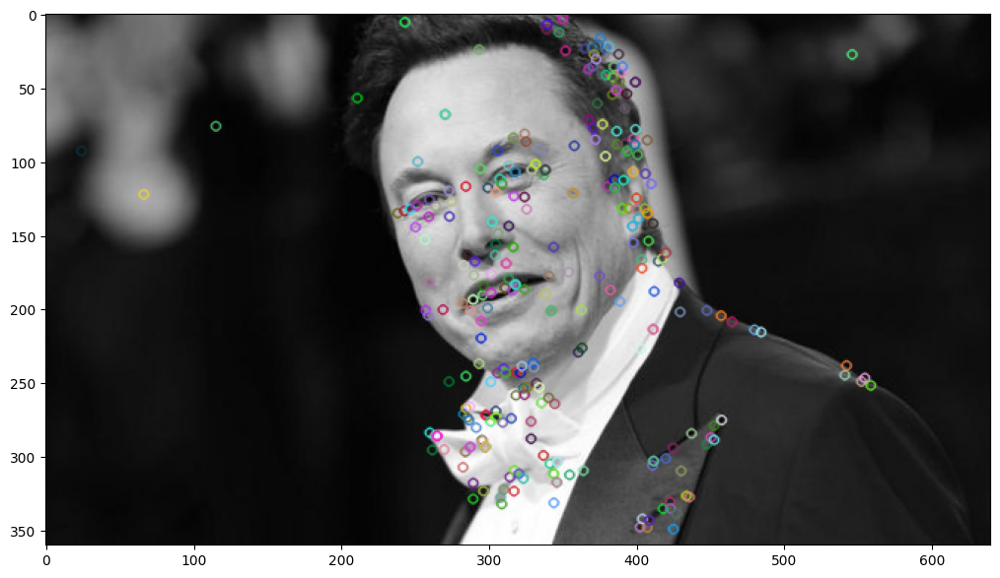

In [ ]:
#img1 = cv2.imread('data/elon_1.jpg')
image_path = download_image(ELON_1)
img1 = cv2.imread(image_path)
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)
plt.show()

### Matching different images

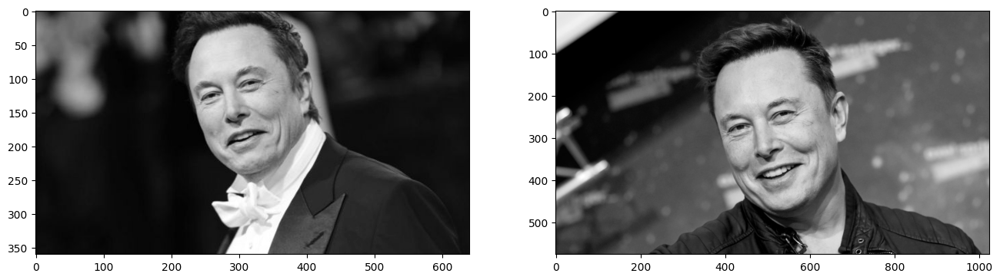

In [ ]:
# read images
ELON_2 = 'https://raw.githubusercontent.com/Edgar-IAH/TC4033data/main/data72/elon_2.png'
image_path = download_image(ELON_1)
img1 = cv2.imread(image_path)
image_path = download_image(ELON_2)
img2 = cv2.imread(image_path)

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')
plt.show()

### Extracting Keypoints with SIFT

In [ ]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(291, 734)

### Feature Matching

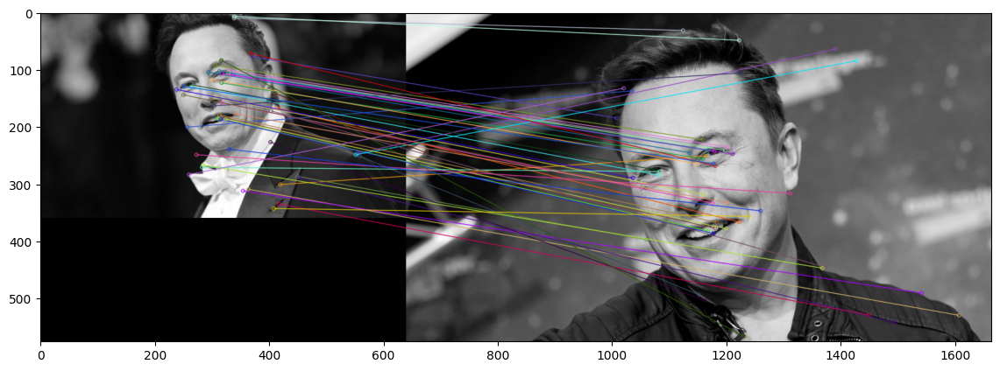

In [ ]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()
plt.show()

#Actividad

## b) Image Matching

Los ejercicios que deben agregarse a este proyecto serán los siguientes:

b) En cuanto al Collab de matching, no se espera tampoco que se haga ninguna modificación al código, pero la idea es probar que tan buenos son los diferentes descriptores para hacer matching de imagenes. Se sugiere usar las imágenes con variaciones de iluminación y orientación y ver que tan bien se hace el matching con Harris por si mismo, o con otros descriptores como SIFT u ORB. Discuta sus hallazgos

**Aplicación del Método ORB en Imágenes Propias**


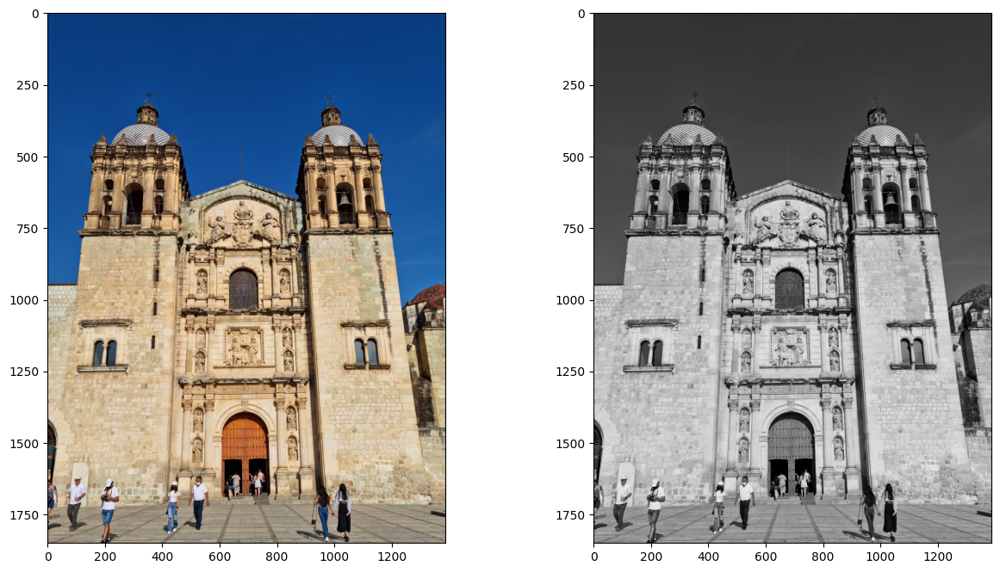

In [ ]:
#Se lee la imagen, se cambia a escala de grises y se despliegan ambas
Oax_Santo_Domingo_1 = 'https://github.com/jogabenn/Actividades-Vision-Computacional/blob/main/Actividad-7.2-Extraccion-de-Caractristicas/20230403_163919.jpg?raw=true'
image_path = download_image(Oax_Santo_Domingo_1)
img = cv2.imread(image_path)

#Reducir Tamaño de la Imagen
scale_percent = 20 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)

# Imagen con nuevas dimensiones
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

img_color = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")
plt.show()


Se define y despliega una imagen de entrenamiento y de prueba, en este caso, dos imágenes del Templo de Santo Domingo en Oaxaca.

In [ ]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

#Se lee la imagen, se cambia a escala de grises y se despliegan ambas
#Oax_Santo_Domingo_2 = 'https://github.com/jogabenn/Actividades-Vision-Computacional/blob/main/Actividad-7.2-Extraccion-de-Caractristicas/20230402_182202.jpg?raw=true'
#image_path = download_image(Oax_Santo_Domingo_2)
#img = cv2.imread(image_path)
#test_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#test_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

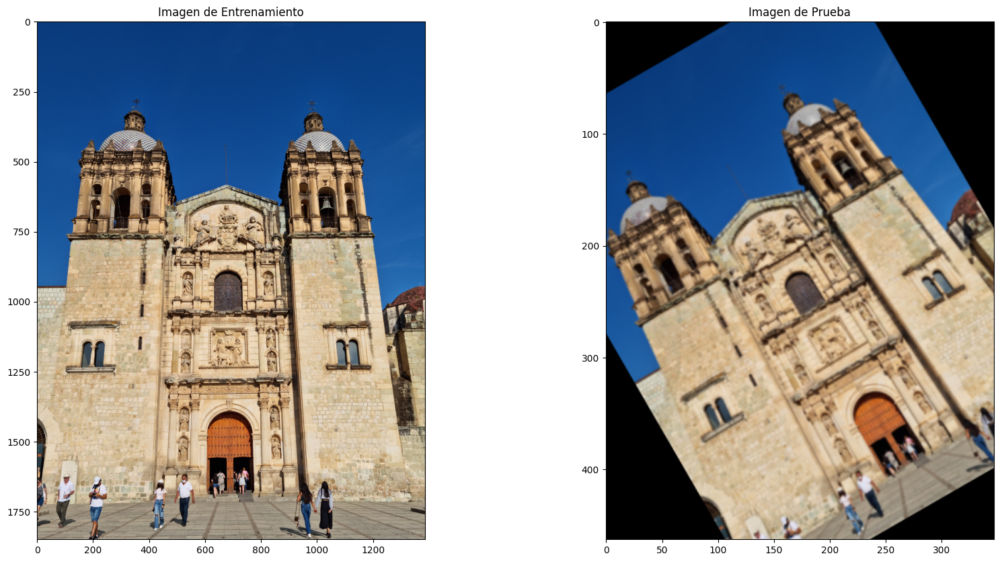

In [ ]:
#Desplegar imagen de entrenamiento y prueba
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Imagen de Entrenamiento")
plots[0].imshow(img_color)

plots[1].set_title("Imagen de Prueba")
plots[1].imshow(test_image)
plt.show()

Aplicación del Método ORB

Número de Puntos Clave Detectados en la Imagen de Entrenamiento:  500
Número de Puntos Clave Detectados en la Imagen de Prueba:  500


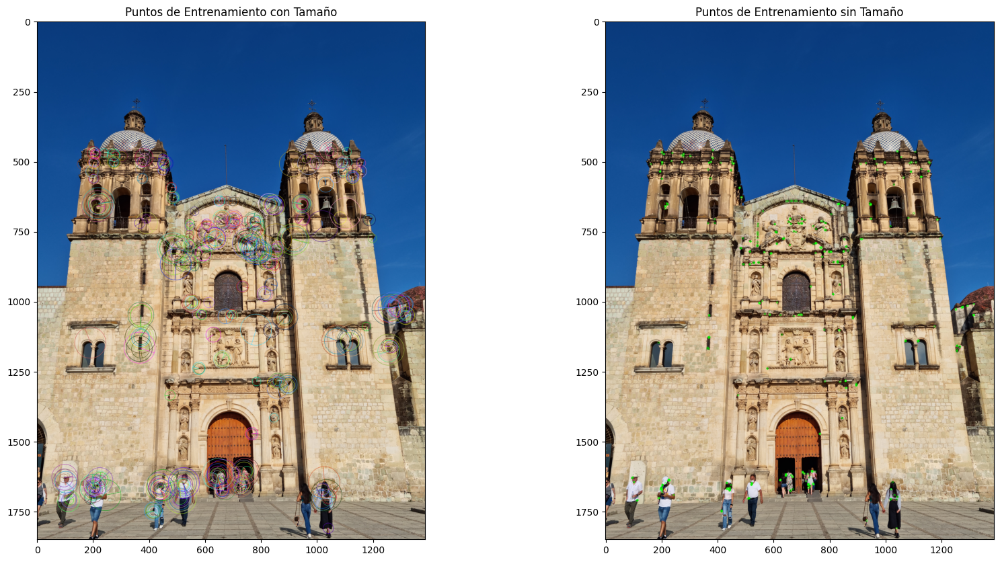

In [ ]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Puntos de Entrenamiento con Tamaño")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Puntos de Entrenamiento sin Tamaño")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Número de Puntos Clave Detectados en la Imagen de Entrenamiento: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Número de Puntos Clave Detectados en la Imagen de Prueba: ", len(test_keypoints))

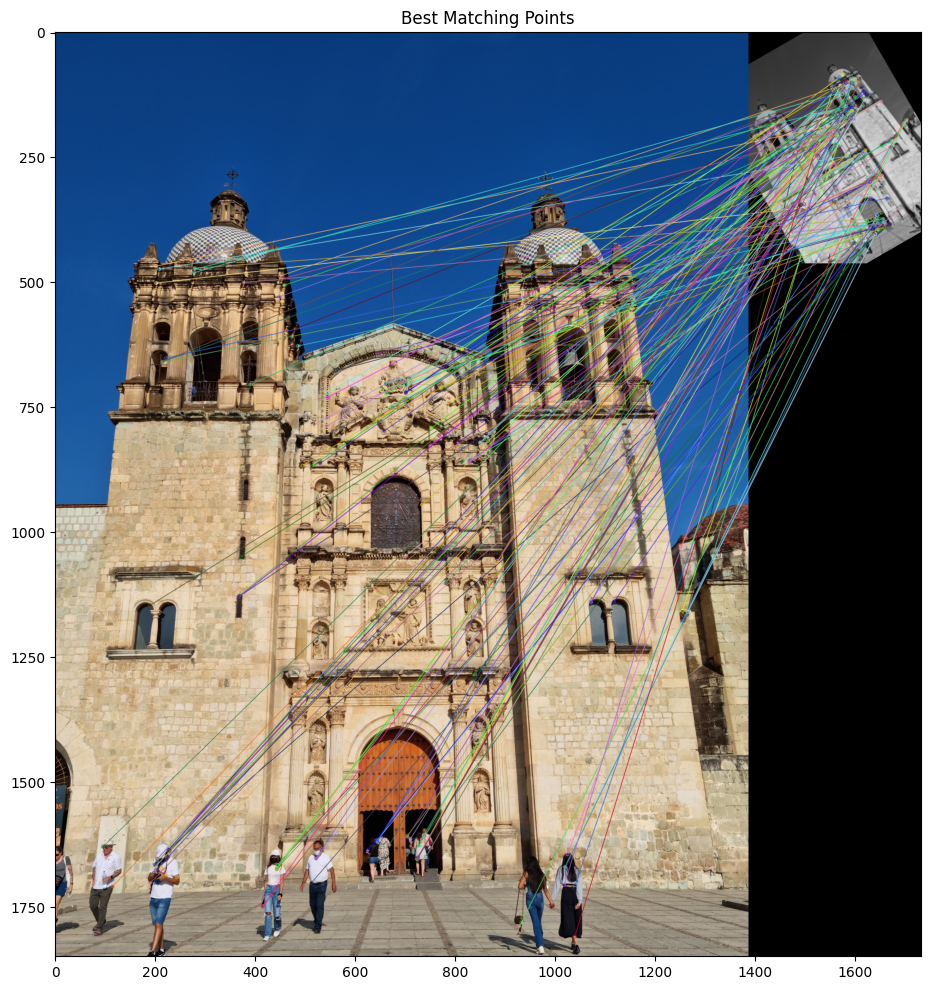


Number of Matching Keypoints Between The Training and Query Images:  162


In [ ]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [20.0, 12.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Aplicación del Método SIFT (Scale Invariant Feature Transform)

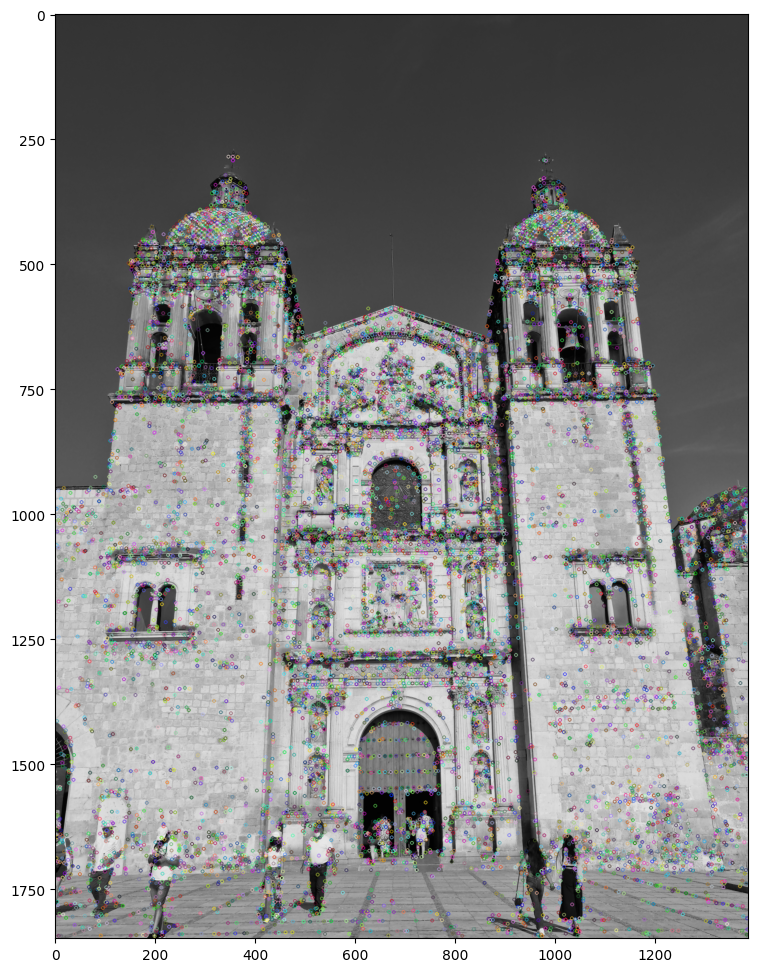

In [ ]:
#img1 = cv2.imread('data/elon_1.jpg')
image_path = download_image(Oax_Santo_Domingo_1)
img1 = cv2.imread(image_path)

#Reducir Tamaño de la Imagen
scale_percent = 20 # percent of original size
width = int(img1.shape[1] * scale_percent / 100)
height = int(img1.shape[0] * scale_percent / 100)
dim = (width, height)

# Imagen con nuevas dimensiones
resized = cv2.resize(img1, dim, interpolation = cv2.INTER_AREA)

gray1 = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(resized,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,resized)
plt.imshow(img_1)
plt.show()

Se una segunda imagen del Templo de Santo Domingo en Oaxaca para intentar realizar una unión por medio del método de SIFT

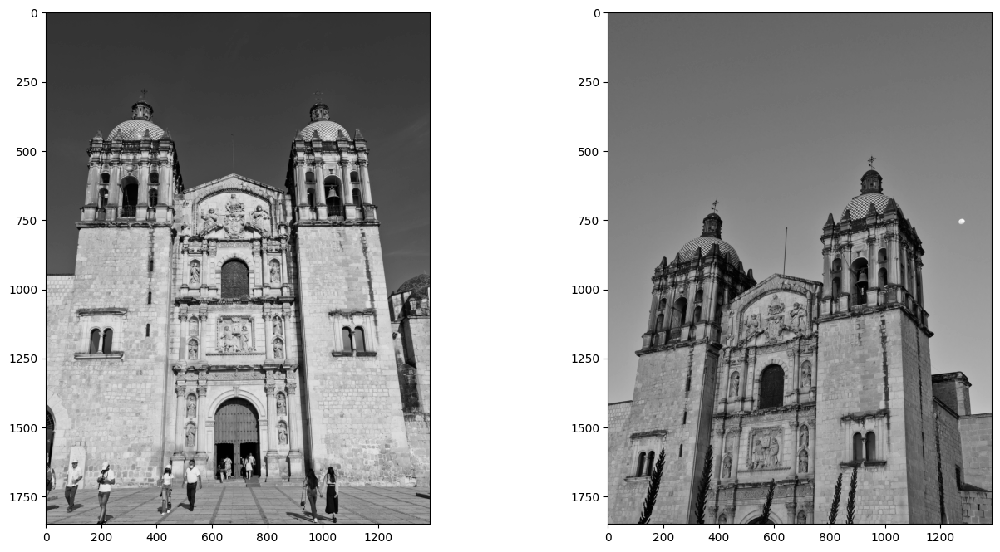

In [ ]:
#Se descarga, reduce y despliega la segunda imagen a comparar
Oax_Santo_Domingo_2 = 'https://github.com/jogabenn/Actividades-Vision-Computacional/blob/main/Actividad-7.2-Extraccion-de-Caractristicas/20230402_182202.jpg?raw=true'
image_path = download_image(Oax_Santo_Domingo_2)
img2 = cv2.imread(image_path)

#Reducir Tamaño de la Imagen
scale_percent = 20 # percent of original size
width = int(img2.shape[1] * scale_percent / 100)
height = int(img2.shape[0] * scale_percent / 100)
dim = (width, height)

# Imagen con nuevas dimensiones
resized2 = cv2.resize(img2, dim, interpolation = cv2.INTER_AREA)

gray2 = cv2.cvtColor(resized2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(gray1, cmap='gray')
ax[1].imshow(gray2, cmap='gray')
plt.show()

Extracción de Puntos Clave con SIFT

In [ ]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(gray1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(gray2,None)

len(keypoints_1), len(keypoints_2)

(13949, 9927)

Unión de Características de Ambas Imágenes

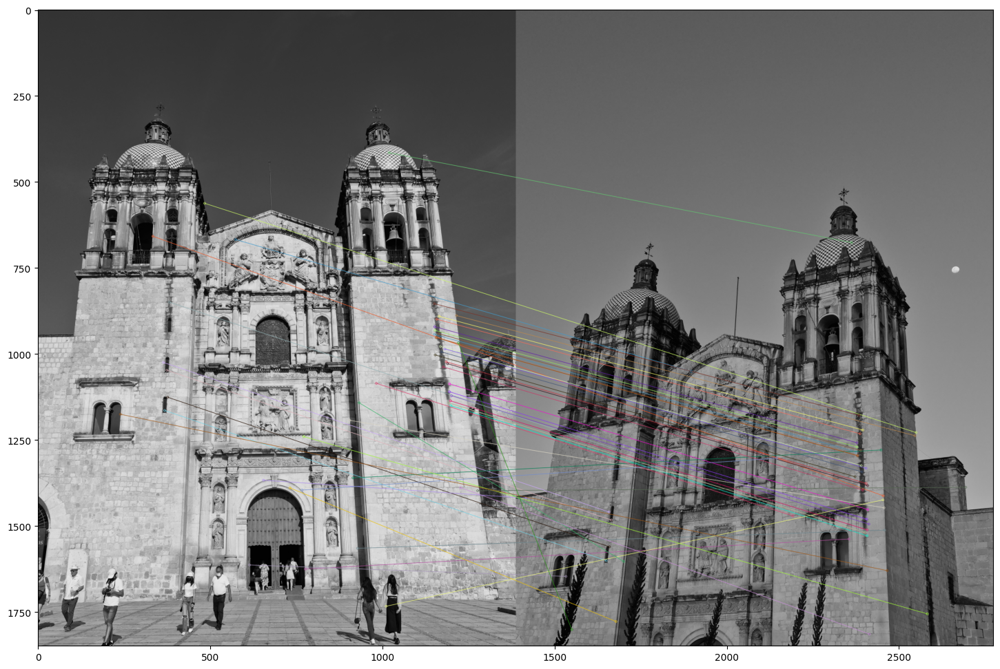

In [ ]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(gray1, keypoints_1, gray2, keypoints_2, matches[:50], gray2, flags=2)
plt.imshow(img3),plt.show()
plt.show()

# **BIBLIOGRAFIA**

Gonzalez, R., y Woods, R. (2018). *Digital Image Processing*. 4th Edition Pearson.

Ochoa, G. (Febrero de 2024). *Modulo 3.2: Extracción de Descriptores*. Presentación de Power Point, Maestría en Inteligencia Artificial Aplicada, ITESM.


